# 1 读取数据，构造关系矩阵

In [290]:
# -*- coding: utf-8 -*-

import networkx as nx
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import pylab
import random

%xmode Verbose
import warnings

# 软件包之间配套时可能会使用过时的接口，把这类告警忽略掉可以让输出信息简练一些
warnings.filterwarnings("ignore", category=DeprecationWarning)

# 把RuntimeWarning忽略掉，不然画图的时候有太多告警了
warnings.filterwarnings("ignore", category=RuntimeWarning)
%matplotlib inline

Exception reporting mode: Verbose


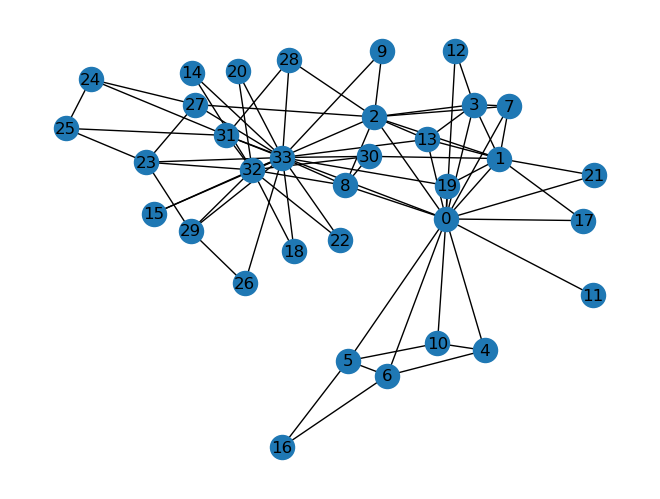

In [291]:
# load the graph
G = nx.karate_club_graph()
nx.draw(G, with_labels = True)

In [292]:
import json

with open('./data.json', encoding='utf-8') as f:
    papers = json.load(f)
papers

[{'article_title': 'Performance Enhanced Predictive Control for Adaptive Cruise Control System Considering Road Elevation Information',
  'doi': '10.1109/TIV.2017.2736246',
  'publication_date': 'Sept. 2017',
  'abstract': 'For road transportation, adaptive cruise control (ACC) is a widely used driver assistance technique with partially longitudinal automation. The existing ACC systems usually ignore the road elevation information, which often ends up with large tracking error and poor fuel economy on the roads with up and down slopes. This paper presents a model-based predictive controller (MPC) for fuel-saving ACC to improve the performances on tracking accuracy and fuel consumption by simultaneously considering the road elevation information, nonlinear powertrain dynamics, and spatiotemporal constraint from preceding vehicle. The feasibility of MPC is enhanced by softening nonsafety related hard constraints, and its asymptotical stability is proved by considering the monotonicity pr

In [293]:
type(papers)

list

In [294]:
print(dict(papers[0]))
print(type(papers))

{'article_title': 'Performance Enhanced Predictive Control for Adaptive Cruise Control System Considering Road Elevation Information', 'doi': '10.1109/TIV.2017.2736246', 'publication_date': 'Sept. 2017', 'abstract': 'For road transportation, adaptive cruise control (ACC) is a widely used driver assistance technique with partially longitudinal automation. The existing ACC systems usually ignore the road elevation information, which often ends up with large tracking error and poor fuel economy on the roads with up and down slopes. This paper presents a model-based predictive controller (MPC) for fuel-saving ACC to improve the performances on tracking accuracy and fuel consumption by simultaneously considering the road elevation information, nonlinear powertrain dynamics, and spatiotemporal constraint from preceding vehicle. The feasibility of MPC is enhanced by softening nonsafety related hard constraints, and its asymptotical stability is proved by considering the monotonicity property 

In [295]:
papers[0]['authors']

[{'name': 'Shengbo Eben Li',
  'author_links': 'https://ieeexplore.ieee.org/author/38184217700',
  'author_affiliation': 'State Key Laboratory of Automotive Safety and Energy, Tsinghua University, Beijing, China'},
 {'name': 'Qiangqiang Guo',
  'author_links': 'https://ieeexplore.ieee.org/author/37086154798',
  'author_affiliation': 'State Key Laboratory of Automotive Safety and Energy, Tsinghua University, Beijing, China'},
 {'name': 'Shaobing Xu',
  'author_links': 'https://ieeexplore.ieee.org/author/37085593109',
  'author_affiliation': 'Department of Mechanical Engineering, University of Michigan, Ann Arbor, MI, USA'},
 {'name': 'Jingliang Duan',
  'author_links': 'https://ieeexplore.ieee.org/author/37086242321',
  'author_affiliation': 'State Key Laboratory of Automotive Safety and Energy, Tsinghua University, Beijing, China'},
 {'name': 'Shen Li',
  'author_links': 'https://ieeexplore.ieee.org/author/37086244392',
  'author_affiliation': 'Department of Civil and Environmental Eng

In [296]:
#文章去重
papers_list = []
doi_set = set()
for paper in papers: 
    title = paper['doi']
    if title not in doi_set:
        papers_list.append(paper)
        doi_set.add(title)
    else:
        print(paper)

#判断文章数是否有变化
print(len(papers))
print(len(papers_list))

454
454


In [297]:
#生成作者列表
authors_obj = set()
authors_name = set()

for paper in papers_list:
    authors = paper['authors']
    for author in authors:
        flag1, flag2 = 0, 0
#         if author not in authors_obj:
#             authors_obj.add(author)
        if author['name'] not in authors_name:
            authors_name.add(author['name'])

In [298]:
len(authors_name)

1446

In [299]:
matrix_zeros = np.zeros([len(papers_list), len(authors_name)])
doi_list = list(doi_set)
table = pd.DataFrame(matrix_zeros, columns=authors_name, index=doi_list, dtype=int)

In [300]:
table

,Shiqi Tang,Chiyomi Miyajima,Cagdas Yaman,Silvère Bonnabel,Yuichi Tazaki,Yan Chen,Wentao Wu,BaekGyu Kim,Sarah M. Thornton,John K. Subosits,...,Zhuyan Yin,Poly Z.H. Sun,Bin Tian,Francis E. Lewis,Xiaohui Yang,Tsubasa Hirakawa,Yanan Zhu,Runwu Shi,Darius Nahavandi,Huaxin Pei
10.1109/TIV.2022.3160165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2020.2991947,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2017.2767825,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2017.2708605,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2022.3195635,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10.1109/TIV.2017.2662482,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2020.2980735,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2021.3137805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2019.2955908,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [301]:
for paper in papers_list:
    authors = paper['authors']
    for author in authors:
        table.loc[paper['doi'],author['name']]=1

In [302]:
table

,Shiqi Tang,Chiyomi Miyajima,Cagdas Yaman,Silvère Bonnabel,Yuichi Tazaki,Yan Chen,Wentao Wu,BaekGyu Kim,Sarah M. Thornton,John K. Subosits,...,Zhuyan Yin,Poly Z.H. Sun,Bin Tian,Francis E. Lewis,Xiaohui Yang,Tsubasa Hirakawa,Yanan Zhu,Runwu Shi,Darius Nahavandi,Huaxin Pei
10.1109/TIV.2022.3160165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2020.2991947,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2017.2767825,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2017.2708605,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2022.3195635,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10.1109/TIV.2017.2662482,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2020.2980735,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2021.3137805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10.1109/TIV.2019.2955908,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [303]:
table_value = table.values[:]
table_value,table_value.shape

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 (454, 1446))

In [304]:
# 计算每个作者发表的文章数，统计table中每列中1的个数即可获得
author_number_of_papers = table.sum(axis=0)
sorted(author_number_of_papers, reverse=True)

[14,
 12,
 11,
 10,
 9,
 8,
 6,
 6,
 6,
 5,
 5,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [305]:
# 计算作者的一些统计信息
author_number_of_papers.describe()

count    1446.000000
mean        1.268326
std         0.880346
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        14.000000
dtype: float64

In [306]:
matrix_coword = np.dot(np.transpose(table_value),table_value)
matrix_coword,matrix_coword.shape

(array([[2, 0, 0, ..., 0, 0, 0],
        [0, 2, 0, ..., 0, 0, 0],
        [0, 0, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 0, 0],
        [0, 0, 0, ..., 0, 1, 0],
        [0, 0, 0, ..., 0, 0, 1]]),
 (1446, 1446))

In [307]:
np.fill_diagonal(matrix_coword, 0)
matrix_coword,matrix_coword.shape

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 (1446, 1446))

In [308]:
matrix_coword.max()

6

In [309]:
matrix_coword.min()

0

In [310]:
# 计算每个节点的度
nodes_degree = matrix_coword.sum(axis=0)

In [311]:
graph_co_word_matrix = nx.from_numpy_array(matrix_coword)
print(nx.info(graph_co_word_matrix))

Graph with 1446 nodes and 3392 edges


In [312]:
coword_labels = nx.get_node_attributes(graph_co_word_matrix,'labels')
coword_labels

{}

In [313]:
list_authors_name = list(authors_name)

for idx, node in enumerate(graph_co_word_matrix.nodes()): 
    print("idx=", idx, "; node=", node)
    coword_labels[node] = list_authors_name[idx]
graph_co_word_matrix = nx.relabel_nodes(graph_co_word_matrix, coword_labels)
sorted(graph_co_word_matrix)

idx= 0 ; node= 0
idx= 1 ; node= 1
idx= 2 ; node= 2
idx= 3 ; node= 3
idx= 4 ; node= 4
idx= 5 ; node= 5
idx= 6 ; node= 6
idx= 7 ; node= 7
idx= 8 ; node= 8
idx= 9 ; node= 9
idx= 10 ; node= 10
idx= 11 ; node= 11
idx= 12 ; node= 12
idx= 13 ; node= 13
idx= 14 ; node= 14
idx= 15 ; node= 15
idx= 16 ; node= 16
idx= 17 ; node= 17
idx= 18 ; node= 18
idx= 19 ; node= 19
idx= 20 ; node= 20
idx= 21 ; node= 21
idx= 22 ; node= 22
idx= 23 ; node= 23
idx= 24 ; node= 24
idx= 25 ; node= 25
idx= 26 ; node= 26
idx= 27 ; node= 27
idx= 28 ; node= 28
idx= 29 ; node= 29
idx= 30 ; node= 30
idx= 31 ; node= 31
idx= 32 ; node= 32
idx= 33 ; node= 33
idx= 34 ; node= 34
idx= 35 ; node= 35
idx= 36 ; node= 36
idx= 37 ; node= 37
idx= 38 ; node= 38
idx= 39 ; node= 39
idx= 40 ; node= 40
idx= 41 ; node= 41
idx= 42 ; node= 42
idx= 43 ; node= 43
idx= 44 ; node= 44
idx= 45 ; node= 45
idx= 46 ; node= 46
idx= 47 ; node= 47
idx= 48 ; node= 48
idx= 49 ; node= 49
idx= 50 ; node= 50
idx= 51 ; node= 51
idx= 52 ; node= 52
idx= 53 ; nod

['Abbas Khosravi',
 'Abderrahim Kasmi',
 'Abdollah Homaifar',
 'Abdoulaye O. Ly',
 'Abhinav Valada',
 'Abhishek Gupta',
 'Adeline Ung',
 'Aditya Ramesh',
 'Ahmad B. Rad',
 'Ahmed Abdel-Rahim',
 'Ahmed S. Ibrahim',
 'Ailan Wan',
 'Aini Hussain',
 'Ajay K. Prasad',
 'Akbar Rahideh',
 'Akshay Rangesh',
 'Alavalapati Goutham Reddy',
 'Albert Solernou Crusat',
 'Albert Y. S. Lam',
 'Aldo Sorniotti',
 'Aleksei Fedorov',
 'Alessandro Astolfi',
 'Alessandro Correa-Victorino',
 'Alessandro Salvi',
 'Alex Levering',
 'Alexander Botros',
 'Alexander Brunker',
 'Alexander Kamann',
 'Alexander Koenig',
 'Alexander Wischnewski',
 'Alexandre Girard',
 'Alexey Vinel',
 'Ali Aliedani',
 'Ali Boyali',
 'Ali Charara',
 'Ali Louati',
 'Ali Mehrizi-Sani',
 'Ali Ufuk Peker',
 'Alireaz Farzaneh',
 'Alizera Bab-Hadiashar',
 'Alois Knoll',
 'Amin Tahmasbi-Sarvestani',
 'Amir Masoud Bozorgi',
 'Amir Rasouli',
 'Ana Aguiar',
 'Anas Mahmoud',
 'Anders Hansson',
 'Andreas A. Malikopoulos',
 'Andreas Hadjigeorgiou'

In [314]:
for idx, node in enumerate(graph_co_word_matrix.nodes()): 
    print("idx=", idx, "; node=", node)

idx= 0 ; node= Shiqi Tang
idx= 1 ; node= Chiyomi Miyajima
idx= 2 ; node= Cagdas Yaman
idx= 3 ; node= Silvère Bonnabel
idx= 4 ; node= Yuichi Tazaki
idx= 5 ; node= Yan Chen
idx= 6 ; node= Wentao Wu
idx= 7 ; node= BaekGyu Kim
idx= 8 ; node= Sarah M. Thornton
idx= 9 ; node= John K. Subosits
idx= 10 ; node= Rui Zhou
idx= 11 ; node= Zhengbing He
idx= 12 ; node= Panagiotis Tsiotras
idx= 13 ; node= Byron Mason
idx= 14 ; node= JiangYu Zheng
idx= 15 ; node= John Dahl
idx= 16 ; node= Jeremy Morton
idx= 17 ; node= Dirk Wollherr
idx= 18 ; node= Zhilu Chen
idx= 19 ; node= Natasha Merat
idx= 20 ; node= Kai-Yuan Cai
idx= 21 ; node= Konrad Doll
idx= 22 ; node= Ying Zhang
idx= 23 ; node= Willem P. Sanberg
idx= 24 ; node= Naman Patel
idx= 25 ; node= Shaheer Ansari
idx= 26 ; node= Chen Lv
idx= 27 ; node= Hiroaki Minoura
idx= 28 ; node= Haohan Yang
idx= 29 ; node= Emmanouil Barmpounakis
idx= 30 ; node= Martin Adams
idx= 31 ; node= Michael Olbrich
idx= 32 ; node= William W. L. Lai
idx= 33 ; node= Stephanie 

# 2 co-authorship分析

## 2.1 整个数据绘制

In [315]:
# 方案2
#pos = nx.circular_layout(maximum_tree)
pos = nx.spring_layout(graph_co_word_matrix)
plt.figure(1,figsize=(80,80),dpi=150)

node_size = [3 + 30 * i for i in author_number_of_papers]
# print(sorted(node_size, reverse=True)

nx.draw(graph_co_word_matrix, pos, node_size=node_size, with_labels=True, font_size=8, font_color="red")
#nx.draw(graph_co_word_matrix, pos, with_labels=True)
#nx.draw_networkx_labels(graph_co_word_matrix, pos, labels)
plt.show()

## 2.2 最大分支关系图绘制

### 2.2.1 不划分社区

联通分支个数：227
Graph with 380 nodes and 1430 edges


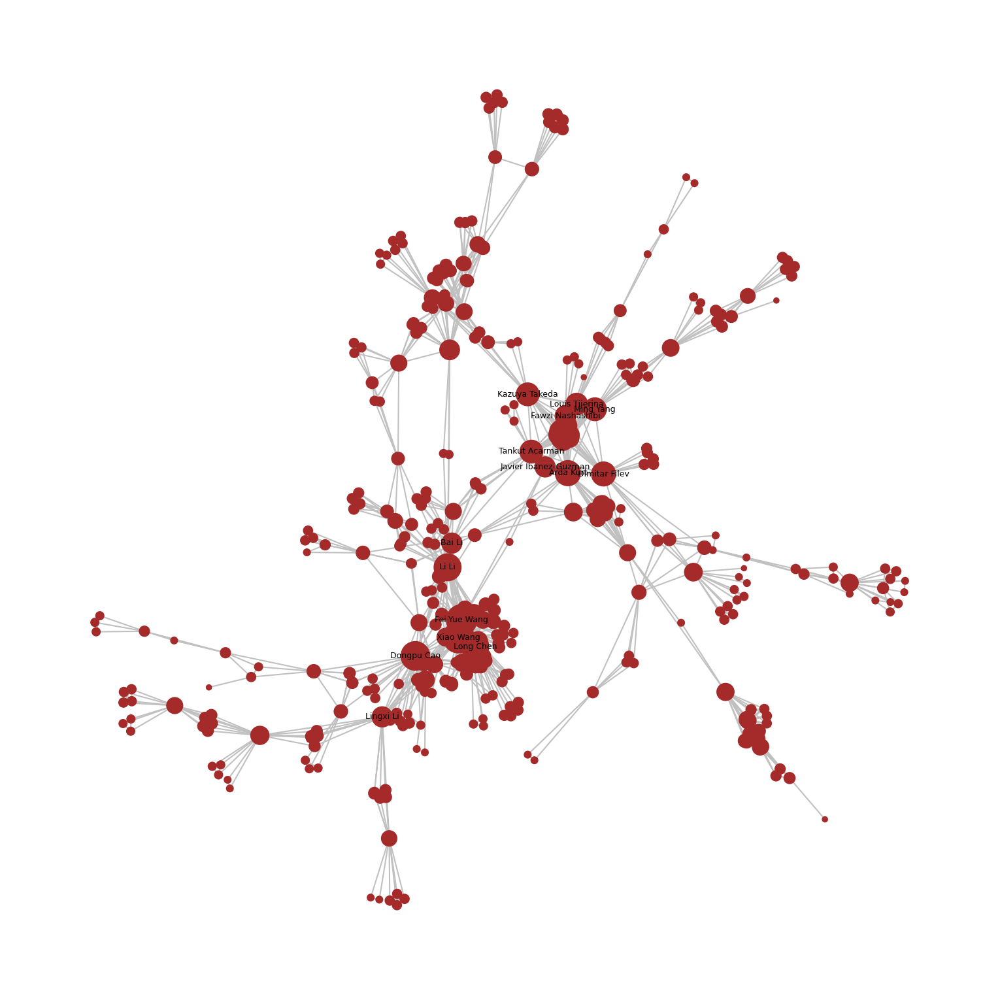

In [316]:
# 分析上面画出来的图，分析联通分支
print(f"联通分支个数：{nx.number_connected_components(graph_co_word_matrix)}")

# 获取 G 中所有的连通子图，然后找出最大的子图
components = nx.connected_components(graph_co_word_matrix)
largest = max(components,key=len)
largest_connected_subgraph = graph_co_word_matrix.subgraph(largest)
print(nx.info(largest_connected_subgraph))

pos = nx.spring_layout(graph_co_word_matrix)
plt.figure(1,figsize=(10,10), dpi=150)
node_size = [val for (node, val) in largest_connected_subgraph.degree()]
node_size = [3 + 10 * i for i in node_size]

# 选择一些重要节点显示标签，其他节点不显示，这里设置节点的度大于20时显示标签
labels = {
    n: (n 
        if len(list(nx.all_neighbors(graph_co_word_matrix, n))) > 20
        else '') 
    for n in graph_co_word_matrix.nodes
}
nx.draw(largest_connected_subgraph, pos, node_size=node_size, with_labels=True, labels=labels,
        font_size=6, font_color="black", node_color='brown', edge_color='silver')
# plt.show()

In [317]:
# 聚类系数计算
print(nx.average_clustering(largest_connected_subgraph)) # 调用函数计算

# 计算每个节点的聚类系数，再计算整个图的聚类系数
cluster_coefficients_map = nx.clustering(largest_connected_subgraph)
ave_cluster_coefficients = 0
for key in cluster_coefficients_map.keys():
    ave_cluster_coefficients += cluster_coefficients_map[key]
ave_cluster_coefficients /= len(cluster_coefficients_map)
ave_cluster_coefficients

0.8686664222874306


0.8686664222874306

### 2.2.2 GN算法社区划分

In [318]:
from networkx.algorithms import community

communities_generator = community.girvan_newman(largest_connected_subgraph.copy())
top_level_co_word = sorted(map(sorted, next(communities_generator)))
top_level_co_word

[['Abdollah Homaifar',
  'Akshay Rangesh',
  'Alessandro Astolfi',
  'Ali Ufuk Peker',
  'Andreas Møgelmose',
  'Ang Marcelo',
  'Anne Verroust-Blondet',
  'Arda Kurt',
  'BaekGyu Kim',
  'Benjamin Ranft',
  'Bing Wang',
  'Boliang Yi',
  'Bowen Weng',
  'Bowen Zhang',
  'Brently Nelson',
  'Brian Paden',
  'Byron Mason',
  'Carlos Fernandez',
  'Changyao Huang',
  'Chao Wang',
  'Chase Murray',
  'Chiyomi Miyajima',
  'Christian Laugier',
  'Christoph Stiller',
  'Chunxiang Wang',
  'Constantin Hubmann',
  'Daniel Althoff',
  'Danil V. Prokhorov',
  'David Bevly',
  'David Kari',
  'David Oswald',
  'Daxin Tian',
  'Dev S. Kochhar',
  'Dezong Zhao',
  'Dimitar Filev',
  'Dmitry Yershov',
  'Dongfang Yang',
  'Ekim Yurtsever',
  'Emilio Frazzoli',
  'Eshed Ohn-Bar',
  'Fawzi Nashashibi',
  'Frank Bonarens',
  'Frankie Lu',
  'Giorgio Rizzoni',
  'Guchan Ozbilgin',
  'Guoyuan Wu',
  'Gültekin Gündüz',
  'H. Eric Tseng',
  'Hanqing Xu',
  'Hao Li',
  'Haolin Zhang',
  'Ho Gi Jung',
  'Hu

In [319]:
second_level_co_word = sorted(map(sorted, next(communities_generator)))
second_level_co_word

[['Abdollah Homaifar',
  'Akshay Rangesh',
  'Alessandro Astolfi',
  'Ali Ufuk Peker',
  'Andreas Møgelmose',
  'Ang Marcelo',
  'Anne Verroust-Blondet',
  'Arda Kurt',
  'BaekGyu Kim',
  'Benjamin Ranft',
  'Bing Wang',
  'Boliang Yi',
  'Bowen Weng',
  'Bowen Zhang',
  'Brently Nelson',
  'Brian Paden',
  'Byron Mason',
  'Carlos Fernandez',
  'Changyao Huang',
  'Chao Wang',
  'Chase Murray',
  'Chiyomi Miyajima',
  'Christian Laugier',
  'Christoph Stiller',
  'Chunxiang Wang',
  'Constantin Hubmann',
  'Daniel Althoff',
  'Danil V. Prokhorov',
  'David Bevly',
  'David Kari',
  'David Oswald',
  'Daxin Tian',
  'Dev S. Kochhar',
  'Dezong Zhao',
  'Dimitar Filev',
  'Dmitry Yershov',
  'Dongfang Yang',
  'Ekim Yurtsever',
  'Emilio Frazzoli',
  'Eshed Ohn-Bar',
  'Fawzi Nashashibi',
  'Frank Bonarens',
  'Frankie Lu',
  'Giorgio Rizzoni',
  'Guchan Ozbilgin',
  'Guoyuan Wu',
  'Gültekin Gündüz',
  'H. Eric Tseng',
  'Hanqing Xu',
  'Hao Li',
  'Haolin Zhang',
  'Ho Gi Jung',
  'Hu

In [320]:
third_level_co_word = sorted(map(sorted, next(communities_generator)))
third_level_co_word

[['Abdollah Homaifar',
  'Akshay Rangesh',
  'Alessandro Astolfi',
  'Ali Ufuk Peker',
  'Andreas Møgelmose',
  'Ang Marcelo',
  'Anne Verroust-Blondet',
  'Arda Kurt',
  'Benjamin Ranft',
  'Bing Wang',
  'Boliang Yi',
  'Bowen Weng',
  'Bowen Zhang',
  'Brently Nelson',
  'Brian Paden',
  'Byron Mason',
  'Carlos Fernandez',
  'Changyao Huang',
  'Chase Murray',
  'Chiyomi Miyajima',
  'Christian Laugier',
  'Christoph Stiller',
  'Chunxiang Wang',
  'Constantin Hubmann',
  'Daniel Althoff',
  'Danil V. Prokhorov',
  'David Bevly',
  'David Kari',
  'Daxin Tian',
  'Dev S. Kochhar',
  'Dezong Zhao',
  'Dimitar Filev',
  'Dmitry Yershov',
  'Dongfang Yang',
  'Ekim Yurtsever',
  'Emilio Frazzoli',
  'Eshed Ohn-Bar',
  'Fawzi Nashashibi',
  'Frank Bonarens',
  'Frankie Lu',
  'Giorgio Rizzoni',
  'Guchan Ozbilgin',
  'Gültekin Gündüz',
  'H. Eric Tseng',
  'Hanqing Xu',
  'Hao Li',
  'Haolin Zhang',
  'Ho Gi Jung',
  'Huijing Zhao',
  'Huiyan Chen',
  'Itheri Yahiaoui',
  'Jacob Vellin

#### 因为后面画图如果简单的按照节点度数大于某个阈值进行筛选标签，那么有可能一些簇的所有节点都没有标签，所以下面先统计一下每个簇中度数最大的前几个节点，方便后面按照人名给需要的节点附加标签。

In [321]:
largest_subgraph_nodes_degree = list(nx.degree(largest_connected_subgraph))
largest_subgraph_nodes_degree

[('Osman D. Altan', 4),
 ('Shiqi Tang', 9),
 ('Chiyomi Miyajima', 8),
 ('Thomas Baltzer Moeslund', 4),
 ('Cagdas Yaman', 5),
 ('Rakesh Nattoji Rajaram', 2),
 ('Yuan Li', 2),
 ('Sujitha Martin', 3),
 ('Walter Talamonti', 5),
 ('Keith A. Redmill', 4),
 ('Yan Chen', 2),
 ('Jilin Mei', 1),
 ('Ali Louati', 5),
 ('Hampton Clay Gabler', 2),
 ('Zhongxu Hu', 8),
 ('Haichuan Gao', 4),
 ('BaekGyu Kim', 9),
 ('Kikuo Fujimura', 6),
 ('Bowen Weng', 3),
 ('Liuyuan Deng', 4),
 ('Weihao Gu', 4),
 ('Rui Zhou', 16),
 ('Byron Mason', 6),
 ('Yuanyuan Chen', 13),
 ('Zhijiang Shao', 5),
 ('Kenji Mase', 3),
 ('David Bevly', 11),
 ('Yougang Bian', 10),
 ('Fei-Yue Wang', 49),
 ('Chen Lv', 16),
 ('Mikhail Gordon', 11),
 ('Haohan Yang', 3),
 ('Zhihuang Zhang', 3),
 ('Ziyou Song', 8),
 ('Martin Adams', 6),
 ('Chao Gou', 10),
 ('Haoran Wang', 7),
 ('Steven E. Shladover', 2),
 ('Miklas Strøm Kristoffersen', 4),
 ('Shaobing Xu', 13),
 ('Cunjia Liu', 6),
 ('Yuqing Guo', 4),
 ('Zhenyu Shou', 5),
 ('Jianjian Yang', 9),


In [322]:
# 对third_level_co_word划分中，每个子集的节点按照度数排序
sub_degree_list = [] # 存放排序结果
for sub_list in third_level_co_word:
    sub_degree_map = dict()
    for i in largest_subgraph_nodes_degree:
        if i[0] in sub_list:
            sub_degree_map[i[0]] = i[1]
    tmp = sorted(sub_degree_map.items(), key = lambda x:x[1], reverse=True)
    sub_degree_list.append(tmp)

for item in sub_degree_list:
    for index in range(6):
        print(item[index])
    print('==============')

('Arda Kurt', 33)
('Dimitar Filev', 30)
('Tankut Acarman', 27)
('Kazuya Takeda', 27)
('Ming Yang', 27)
('Louis Tijerina', 24)
('Xiao Wang', 51)
('Fei-Yue Wang', 49)
('Dongpu Cao', 43)
('Long Chen', 39)
('Li Li', 38)
('Lingxi Li', 21)
('Guoyuan Wu', 15)
('Matthew J. Barth', 13)
('Ziran Wang', 13)
('Kanok Boriboonsomsin', 13)
('Prashant Tiwari', 12)
('Kyungtae Han', 12)
('Shen Li', 20)
('Shaobing Xu', 13)
('Shengbo Eben Li', 12)
('Jianqiang Wang', 12)
('Yougang Bian', 10)
('Biao Xu', 10)


In [360]:
# 用这个函数，可以最多画4种颜色不同的社区
def plot_communities(G, group_array):
    color_map = []
    for node in G:
        found = False
        for idx, group in enumerate(group_array):
            if node in group:
                found = True
                if idx == 0:
                    color_map.append('#F08A5D')#59BE8D
                elif idx == 1:
                    color_map.append('#3F72AF')#7F8EAE
                elif idx == 2:
                    color_map.append('#6A2C70')#59327A
                elif idx == 3:
                    color_map.append('#AD8B73')
                else:
                    color_map.append('blueviolet')
        if found == False:
            color_map.append('silver')

#     nx.draw(G, node_color=color_map, with_labels=True, font_color='white')
#     plt.figure(1,figsize=(10,10), dpi=150)
    seed = random.randint(1, 100)
    print(f'seed = {seed}')
    pos = nx.spring_layout(G, seed=26)
#     pos = nx.kamada_kawai_layout(G) # 这个画出来这个图很丑
#     pos = nx.fruchterman_reingold_layout(G, seed=seed)#44,36
    plt.figure(1, figsize=(11,11), dpi=100)
    node_size = [val for (node, val) in G.degree()]
    node_size = [1 + 20 * (i) for i in node_size]
    
    # 选择一些重要节点显示标签，其他节点不显示，这里设置节点的度大于20时显示标签
    labels = {
        n: (n 
            if len(list(nx.all_neighbors(G, n))) > 25 or 'Guoyuan Wu' == n or 'Shen Li' == n
            else '') 
        for n in G.nodes
    }
    nx.draw_networkx_nodes(G, pos=pos,
                           node_color=color_map,
                           node_size=node_size,
                           node_shape='o',
                           linewidths=1,
                           edgecolors='black',
                           alpha=0.7,#0.6
                          )
    label_options = {"edgecolor": "white", "facecolor": "white", "alpha": 0.5, "boxstyle" : "round, pad=0.2",
                    }
    nx.draw_networkx_labels(G, pos=pos,
                            labels=labels,
                            font_size=8,
                            font_color='black',
                            bbox=label_options,
                            horizontalalignment='left',
                            verticalalignment='center_baseline',
                            font_family='Times New Roman')
    nx.draw_networkx_edges(G, pos=pos,
                           edge_color='black',
                           alpha=0.4,
                           width=0.5)
    
    plt.axis("off")
    plt.savefig('co-authorship_1.pdf')
    plt.show()
    

seed = 98


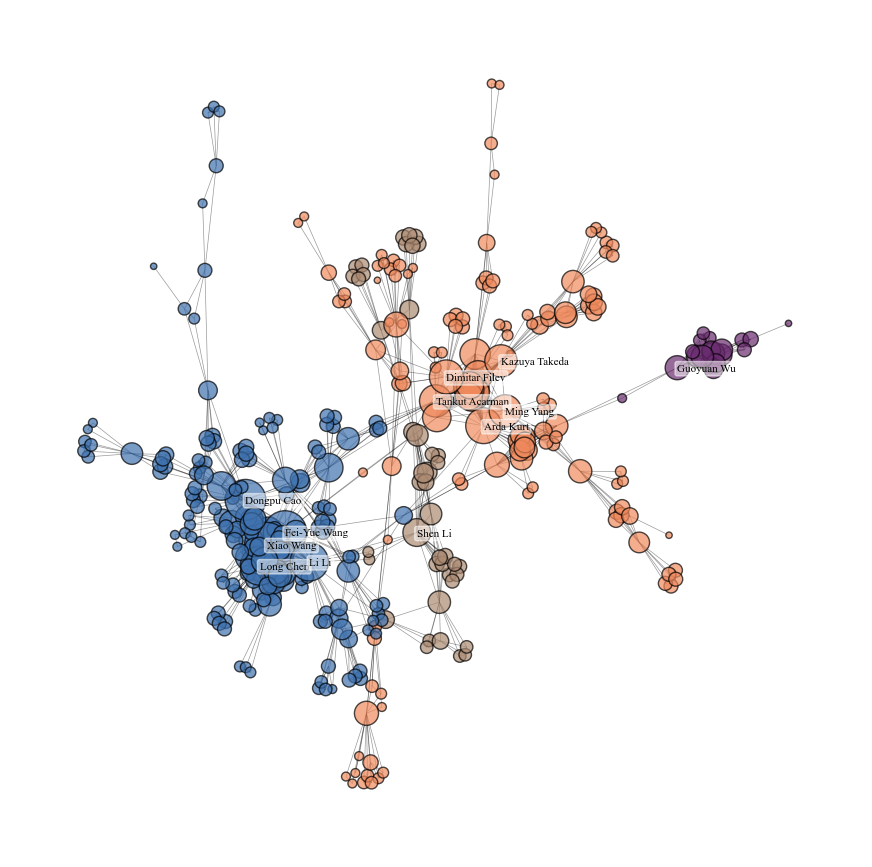

In [361]:
plot_communities(largest_connected_subgraph, third_level_co_word)

In [344]:
type(graph_co_word_matrix),type(largest_connected_subgraph)

(networkx.classes.graph.Graph, networkx.classes.graph.Graph)

## 2.3 其他分支绘图

### 2.3.1 第二大分支

Graph with 24 nodes and 85 edges


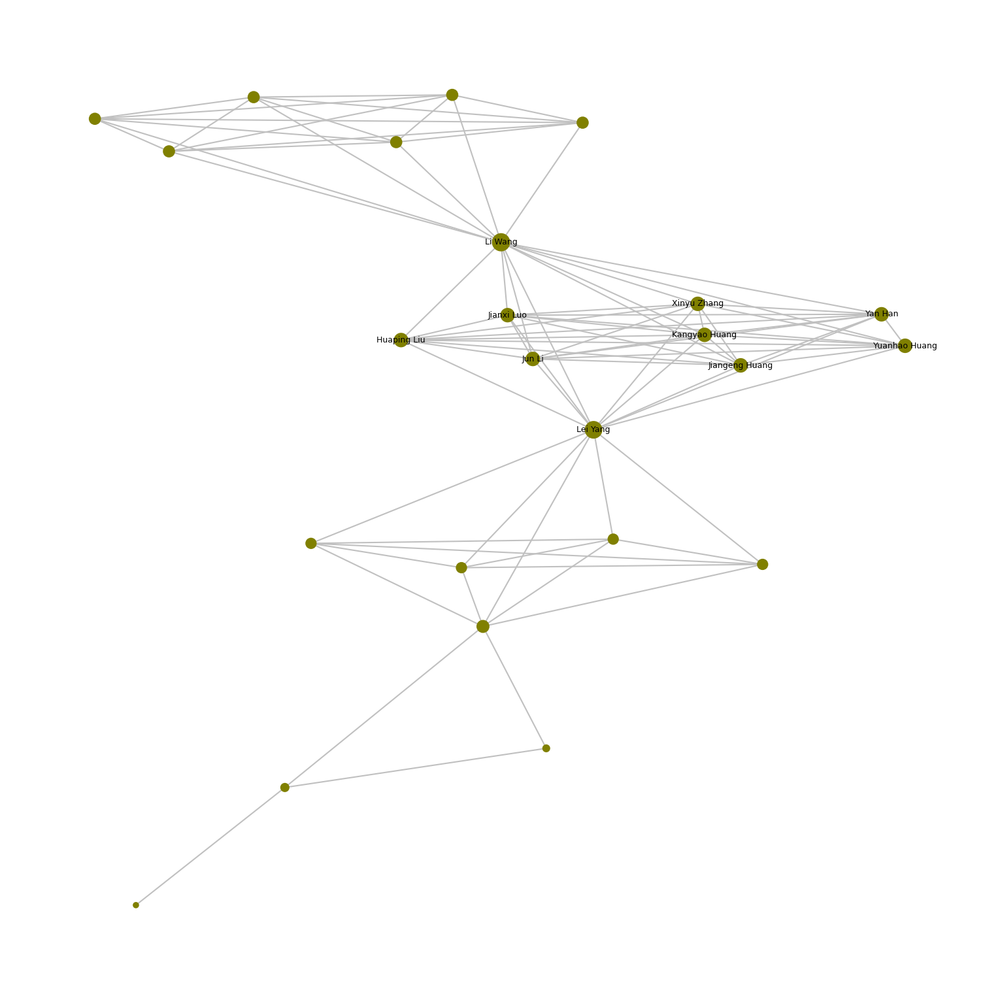

In [362]:

components = nx.connected_components(graph_co_word_matrix)
components_list = sorted(components,key=len,reverse=True)

connected_subgraph = graph_co_word_matrix.subgraph(components_list[1])
print(nx.info(connected_subgraph))

pos = nx.spring_layout(connected_subgraph)
plt.figure(1,figsize=(10,10), dpi=150)
node_size = [val for (node, val) in connected_subgraph.degree()]
node_size = [3 + 10 * i for i in node_size]

# 选择一些重要节点显示标签，其他节点不显示
labels = {
    n: (n 
        if len(list(nx.all_neighbors(connected_subgraph, n))) > 8
        else '') 
    for n in connected_subgraph.nodes
}
nx.draw(connected_subgraph, pos, node_size=node_size, with_labels=True, labels=labels,
        font_size=6, font_color="black", node_color='olive', edge_color='silver')
plt.show()

In [363]:
# 聚类系数计算
print(nx.average_clustering(connected_subgraph))

0.8686813186813186


In [364]:
communities_generator = community.girvan_newman(connected_subgraph.copy())
top_level_co_word = sorted(map(sorted, next(communities_generator)))
top_level_co_word

[['Bei Zhou', 'Danjie Zhu', 'Simon X. Yang'],
 ['Daqi Zhu',
  'Huaping Liu',
  'Jiangeng Huang',
  'Jianxi Luo',
  'Jun Li',
  'Kangyao Huang',
  'Lei Yang',
  'Li Wang',
  'Qiaoni Han',
  'Wenyang Gan',
  'Xianpeng Shi',
  'Xiaoyuan Luo',
  'Xinyu Zhang',
  'Xu Yang',
  'Yan Han',
  'Yijing Wang',
  'Yuanhao Huang',
  'Yunsai Chen',
  'Zhen Hu',
  'Zheng Li',
  'Zhiqiang Zuo']]

In [365]:
second_level_co_word = sorted(map(sorted, next(communities_generator)))
second_level_co_word

[['Bei Zhou', 'Danjie Zhu', 'Simon X. Yang'],
 ['Daqi Zhu', 'Wenyang Gan', 'Xianpeng Shi', 'Yunsai Chen', 'Zhen Hu'],
 ['Huaping Liu',
  'Jiangeng Huang',
  'Jianxi Luo',
  'Jun Li',
  'Kangyao Huang',
  'Lei Yang',
  'Li Wang',
  'Qiaoni Han',
  'Xiaoyuan Luo',
  'Xinyu Zhang',
  'Xu Yang',
  'Yan Han',
  'Yijing Wang',
  'Yuanhao Huang',
  'Zheng Li',
  'Zhiqiang Zuo']]

In [366]:
subgraph_nodes_degree = list(nx.degree(connected_subgraph))
subgraph_nodes_degree

[('Li Wang', 15),
 ('Xu Yang', 6),
 ('Yijing Wang', 6),
 ('Kangyao Huang', 9),
 ('Zhiqiang Zuo', 6),
 ('Yan Han', 9),
 ('Qiaoni Han', 6),
 ('Xianpeng Shi', 5),
 ('Jun Li', 9),
 ('Yunsai Chen', 5),
 ('Jianxi Luo', 9),
 ('Xinyu Zhang', 9),
 ('Huaping Liu', 9),
 ('Daqi Zhu', 7),
 ('Simon X. Yang', 3),
 ('Yuanhao Huang', 9),
 ('Zhen Hu', 5),
 ('Bei Zhou', 2),
 ('Danjie Zhu', 1),
 ('Zheng Li', 6),
 ('Lei Yang', 14),
 ('Jiangeng Huang', 9),
 ('Xiaoyuan Luo', 6),
 ('Wenyang Gan', 5)]

In [367]:
sub_degree_list = [] # 存放排序结果
for sub_list in second_level_co_word:
    sub_degree_map = dict()
    for i in subgraph_nodes_degree:
        if i[0] in sub_list:
            sub_degree_map[i[0]] = i[1]
    tmp = sorted(sub_degree_map.items(), key = lambda x:x[1], reverse=True)
    sub_degree_list.append(tmp)

for item in sub_degree_list:
    for index in range(len(item)):
        print(item[index])
    print('==============')

('Simon X. Yang', 3)
('Bei Zhou', 2)
('Danjie Zhu', 1)
('Daqi Zhu', 7)
('Xianpeng Shi', 5)
('Yunsai Chen', 5)
('Zhen Hu', 5)
('Wenyang Gan', 5)
('Li Wang', 15)
('Lei Yang', 14)
('Kangyao Huang', 9)
('Yan Han', 9)
('Jun Li', 9)
('Jianxi Luo', 9)
('Xinyu Zhang', 9)
('Huaping Liu', 9)
('Yuanhao Huang', 9)
('Jiangeng Huang', 9)
('Xu Yang', 6)
('Yijing Wang', 6)
('Zhiqiang Zuo', 6)
('Qiaoni Han', 6)
('Zheng Li', 6)
('Xiaoyuan Luo', 6)


In [374]:
# 用这个函数，可以最多画4种颜色不同的社区
def plot_communities2(G, group_array):
    # 移除一些节点以及和他相邻的边
    G = nx.Graph(G) # 解冻，不然图无法修改， 参考：https://www.declarecode.com/code-solutions/python/frozen-graph-cant-be-modified
    G.remove_node('Simon X. Yang')
    G.remove_node('Danjie Zhu')
    G.remove_node('Bei Zhou')
    
    color_map = []
    for node in G:
        found = False
        for idx, group in enumerate(group_array):
            if node in group:
                found = True
                if idx == 0:
                    color_map.append('#F08A5D')#59BE8D
                elif idx == 1:
                    color_map.append('#3F72AF')#7F8EAE
                elif idx == 2:
                    color_map.append('#6A2C70')#59327A
                elif idx == 3:
                    color_map.append('#AD8B73')
                else:
                    color_map.append('blueviolet')
        if found == False:
            color_map.append('silver')
            
    
    seed = random.randint(1, 1000)
    print(f'seed = {seed}')
#     pos = nx.spring_layout(G, seed=seed)
#     pos = nx.fruchterman_reingold_layout(G, seed=448)
    pos = nx.kamada_kawai_layout(G)#, seed=seed
    plt.figure(1, figsize=(9,5), dpi=100)
    node_size = [val for (node, val) in G.degree()]
    node_size = [1 + 30 * (i) for i in node_size]
    
    # 选择一些重要节点显示标签，其他节点不显示，这里设置节点的度大于20时显示标签
    labels = {
        n: (n 
            if len(list(nx.all_neighbors(G, n))) > 6 or 'Simon X. Yang' == n or 'Daqi Zhu' == n
            else '') 
        for n in G.nodes
    }
    
    
    
    nx.draw_networkx_nodes(G, pos=pos,
                           node_color=color_map,
                           node_size=node_size,
                           node_shape='o',
                           linewidths=1,
                           edgecolors='black',
                           alpha=0.7)
    label_options = {"edgecolor": "white", "facecolor": "white", "alpha": 0.5, "boxstyle" : "round, pad=0.2"}
    nx.draw_networkx_labels(G, pos=pos,
                            labels=labels,
                            font_size=8,
                            font_color='black',
                            bbox=label_options,
                            horizontalalignment='left',
                            verticalalignment='center_baseline',
                            font_family='Times New Roman')
    nx.draw_networkx_edges(G, pos=pos,
                           edge_color='black',
                           alpha=0.4,
                           width=0.5)
    

    plt.axis("off")
    plt.savefig('co-authorship_2.pdf')
    plt.show()

seed = 895


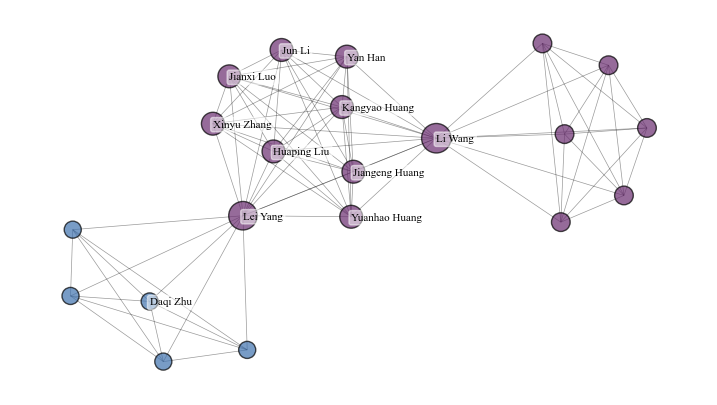

In [375]:
plot_communities2(connected_subgraph, second_level_co_word)

### 2.3.2 第三大分支

Graph with 19 nodes and 51 edges


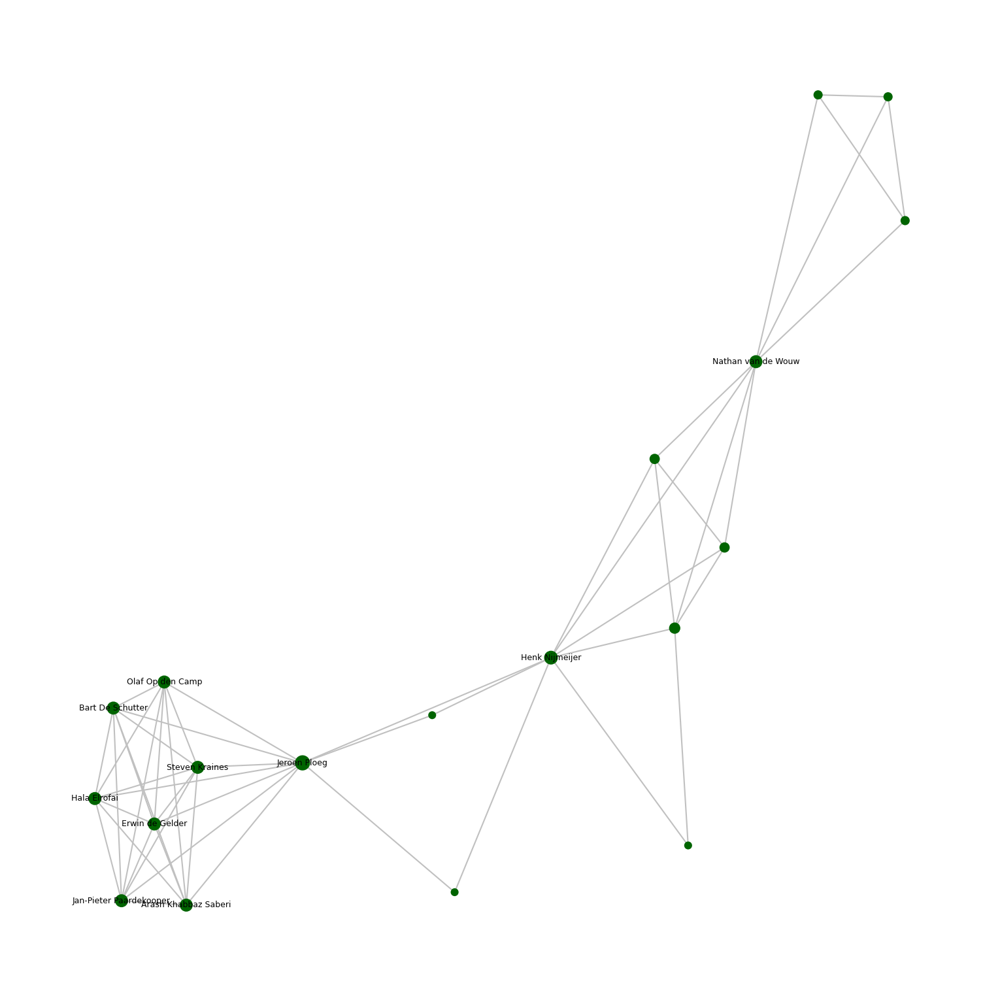

In [376]:
components = nx.connected_components(graph_co_word_matrix)
components_list = sorted(components,key=len,reverse=True)

connected_subgraph = graph_co_word_matrix.subgraph(components_list[2])
print(nx.info(connected_subgraph))

pos = nx.spring_layout(connected_subgraph)
plt.figure(1,figsize=(10,10), dpi=150)
node_size = [val for (node, val) in connected_subgraph.degree()]
node_size = [3 + 10 * i for i in node_size]

# 选择一些重要节点显示标签，其他节点不显示
labels = {
    n: (n 
        if len(list(nx.all_neighbors(connected_subgraph, n))) > 5
        else '') 
    for n in connected_subgraph.nodes
}
nx.draw(connected_subgraph, pos, node_size=node_size, with_labels=True, labels=labels,
        font_size=6, font_color="black", node_color='darkgreen', edge_color='silver')
plt.show()

In [377]:
# 聚类系数计算
print(nx.average_clustering(connected_subgraph))

0.8926900584795322


In [378]:
communities_generator = community.girvan_newman(connected_subgraph.copy())
top_level_co_word = sorted(map(sorted, next(communities_generator)))
top_level_co_word

[['Arash Khabbaz Saberi',
  'Bart De Schutter',
  'Erwin de Gelder',
  'Haitao Xing',
  'Hala Elrofai',
  'Jan-Pieter Paardekooper',
  'Jeroen Ploeg',
  'Olaf Op den Camp',
  'Robbin van Hoek',
  'Steven Kraines'],
 ['Elham Semsar-Kazerooni',
  'Ellen van Nunen',
  'Henk Nijmeijer',
  'Igo Besselink',
  'Jan Loof',
  'Joey Reinders',
  'Karel Kural',
  'Nathan van de Wouw',
  'Pavlos Hatzidimitris']]

In [379]:
second_level_co_word = sorted(map(sorted, next(communities_generator)))
second_level_co_word

[['Arash Khabbaz Saberi',
  'Bart De Schutter',
  'Erwin de Gelder',
  'Haitao Xing',
  'Hala Elrofai',
  'Jan-Pieter Paardekooper',
  'Jeroen Ploeg',
  'Olaf Op den Camp',
  'Robbin van Hoek',
  'Steven Kraines'],
 ['Elham Semsar-Kazerooni',
  'Ellen van Nunen',
  'Joey Reinders',
  'Nathan van de Wouw'],
 ['Henk Nijmeijer',
  'Igo Besselink',
  'Jan Loof',
  'Karel Kural',
  'Pavlos Hatzidimitris']]

In [380]:
subgraph_nodes_degree = list(nx.degree(connected_subgraph))
subgraph_nodes_degree

[('Robbin van Hoek', 2),
 ('Henk Nijmeijer', 8),
 ('Joey Reinders', 3),
 ('Igo Besselink', 5),
 ('Bart De Schutter', 7),
 ('Hala Elrofai', 7),
 ('Jan-Pieter Paardekooper', 7),
 ('Pavlos Hatzidimitris', 4),
 ('Karel Kural', 4),
 ('Haitao Xing', 2),
 ('Arash Khabbaz Saberi', 7),
 ('Nathan van de Wouw', 7),
 ('Steven Kraines', 7),
 ('Elham Semsar-Kazerooni', 3),
 ('Jeroen Ploeg', 10),
 ('Erwin de Gelder', 7),
 ('Jan Loof', 2),
 ('Olaf Op den Camp', 7),
 ('Ellen van Nunen', 3)]

In [381]:
sub_degree_list = [] # 存放排序结果
for sub_list in second_level_co_word:
    sub_degree_map = dict()
    for i in subgraph_nodes_degree:
        if i[0] in sub_list:
            sub_degree_map[i[0]] = i[1]
    tmp = sorted(sub_degree_map.items(), key = lambda x:x[1], reverse=True)
    sub_degree_list.append(tmp)

for item in sub_degree_list:
    for index in range(3):
        print(item[index])
    print('==============')

('Jeroen Ploeg', 10)
('Bart De Schutter', 7)
('Hala Elrofai', 7)
('Nathan van de Wouw', 7)
('Joey Reinders', 3)
('Elham Semsar-Kazerooni', 3)
('Henk Nijmeijer', 8)
('Igo Besselink', 5)
('Pavlos Hatzidimitris', 4)


In [400]:
# 用这个函数，可以最多画4种颜色不同的社区
def plot_communities3(G, group_array):
    color_map = []
    for node in G:
        found = False
        for idx, group in enumerate(group_array):
            if node in group:
                found = True
                if idx == 0:
                    color_map.append('#F08A5D')#59BE8D
                elif idx == 1:
                    color_map.append('#3F72AF')#7F8EAE
                elif idx == 2:
                    color_map.append('#6A2C70')#59327A
                elif idx == 3:
                    color_map.append('#AD8B73')
                else:
                    color_map.append('blueviolet')
        if found == False:
            color_map.append('silver')

#     nx.draw(G, node_color=color_map, with_labels=True, font_color='white')
#     plt.figure(1,figsize=(10,10), dpi=150)
    seed = random.randint(1, 100)
    print(f'seed = {seed}')
#     pos = nx.spring_layout(G, seed=seed)#80
#     pos = nx.fruchterman_reingold_layout(G, seed=40)
    pos = nx.kamada_kawai_layout(G)#, seed=seed
    plt.figure(1, figsize=(9,5), dpi=100)
    node_size = [val for (node, val) in G.degree()]
    node_size = [1 + 30 * (i) for i in node_size]
    
    # 选择一些重要节点显示标签，其他节点不显示，这里设置节点的度大于20时显示标签
    labels = {
        n: (n 
            if len(list(nx.all_neighbors(G, n))) > 6
            else '') 
        for n in G.nodes
    }
    nx.draw_networkx_nodes(G, pos=pos,
                           node_color=color_map,
                           node_size=node_size,
                           node_shape='o',
                           linewidths=1,
                           edgecolors='black',
                           alpha=0.7)
    label_options = {"edgecolor": "white", "facecolor": "white", "alpha": 0.5, "boxstyle" : "round, pad=0.2"}
    nx.draw_networkx_labels(G, pos=pos,
                            labels=labels,
                            font_size=8,
                            font_color='black',
                            bbox=label_options,
                            horizontalalignment='left',
                            verticalalignment='center_baseline',
                            font_family='Times New Roman')
    nx.draw_networkx_edges(G, pos=pos,
                           edge_color='black',
                           alpha=0.4,
                           width=0.5)
    

#     nx.draw(G, pos, node_size=node_size, with_labels=True, labels=labels,
#         font_size=10, font_color="black", node_color=color_map, edge_color='gainsboro', font_family='KaiTi', alpha=0.4)

    plt.axis("off")
    plt.savefig('co-authorship_3.pdf')
    plt.show()

seed = 84


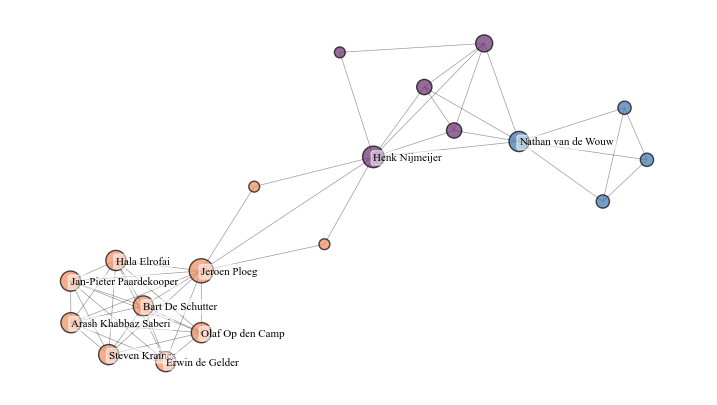

In [401]:
plot_communities3(connected_subgraph, second_level_co_word)

In [50]:
largest_connected_subgraph.degree()

DegreeView({'Xiaolin Meng': 4, 'Jack Terwilliger': 4, 'Yutong Wang': 15, 'Qing Xu': 7, 'Ali Ufuk Peker': 3, 'Sujitha Martin': 3, 'Wu-Ling Huang': 4, 'Meng Ding': 2, 'Lingxi Li': 21, 'Reates Curry': 5, 'Zhiheng Li': 7, 'Haohan Yang': 3, 'Jiawei Zhang': 5, 'Kyungtae Han': 12, 'Hong Wang': 9, 'Mikhail Gordon': 11, 'Serdar Coskun': 5, 'Matthew Barth': 13, 'Yu Gao': 6, 'Jianqiang Wang': 12, 'Danil V. Prokhorov': 6, 'Çağdaş Yaman': 3, 'H. Eric Tseng': 5, 'Anne Verroust-Blondet': 3, 'Xiaobo Chen': 5, 'Yiwen Huang': 2, 'Wei Han': 4, 'Naohisha Hashimoto': 6, 'Yue Zhang': 5, 'Hao Li': 4, 'Ramanujan Jagannathan': 6, 'Masataka Mori': 6, 'Guchan Ozbilgin': 11, 'Fangyin Tian': 7, 'Yifan Tang': 4, 'Carlos Fernandez': 2, 'Hampton Clay Gabler': 2, 'Dong Chen': 5, 'Osman D. Altan': 4, 'Qian Chen': 5, 'Junni Li': 5, 'Takashi Bando': 7, 'Zujie Zhang': 7, 'Yi Zhang': 7, 'Ziyou Song': 8, 'Takatsugu Hirayama': 3, 'Lex Fridman': 4, 'Mohammad R. Hajidavalloo': 5, 'Bowen Weng': 3, 'Manjiang Hu': 5, 'Daniel Alth

In [51]:
largest_connected_subgraph.nodes

NodeView(('Xiaolin Meng', 'Jack Terwilliger', 'Yutong Wang', 'Qing Xu', 'Ali Ufuk Peker', 'Sujitha Martin', 'Wu-Ling Huang', 'Meng Ding', 'Lingxi Li', 'Reates Curry', 'Zhiheng Li', 'Haohan Yang', 'Jiawei Zhang', 'Kyungtae Han', 'Hong Wang', 'Mikhail Gordon', 'Serdar Coskun', 'Matthew Barth', 'Yu Gao', 'Jianqiang Wang', 'Danil V. Prokhorov', 'Çağdaş Yaman', 'H. Eric Tseng', 'Anne Verroust-Blondet', 'Xiaobo Chen', 'Yiwen Huang', 'Wei Han', 'Naohisha Hashimoto', 'Yue Zhang', 'Hao Li', 'Ramanujan Jagannathan', 'Masataka Mori', 'Guchan Ozbilgin', 'Fangyin Tian', 'Yifan Tang', 'Carlos Fernandez', 'Hampton Clay Gabler', 'Dong Chen', 'Osman D. Altan', 'Qian Chen', 'Junni Li', 'Takashi Bando', 'Zujie Zhang', 'Yi Zhang', 'Ziyou Song', 'Takatsugu Hirayama', 'Lex Fridman', 'Mohammad R. Hajidavalloo', 'Bowen Weng', 'Manjiang Hu', 'Daniel Althoff', 'Reza Langari', 'Yonglin Tian', 'Yakun Ouyang', 'Junyi Chen', 'Keith Redmill', 'Shiqi Tang', 'Sze Zheng Yong', 'Philipp Bender', 'Yougang Bian', 'Jiangli

In [52]:
node_size = [val for (node, val) in largest_connected_subgraph.degree()]
node_size = [3 + 10 * i for i in node_size]
node_size

[43,
 43,
 153,
 73,
 33,
 33,
 43,
 23,
 213,
 53,
 73,
 33,
 53,
 123,
 93,
 113,
 53,
 133,
 63,
 123,
 63,
 33,
 53,
 33,
 53,
 23,
 43,
 63,
 53,
 43,
 63,
 63,
 113,
 73,
 43,
 23,
 23,
 53,
 43,
 53,
 53,
 73,
 73,
 73,
 83,
 33,
 43,
 53,
 33,
 53,
 43,
 53,
 153,
 93,
 43,
 133,
 93,
 63,
 33,
 103,
 63,
 33,
 53,
 43,
 33,
 83,
 73,
 33,
 13,
 393,
 153,
 33,
 193,
 193,
 223,
 33,
 63,
 43,
 53,
 83,
 143,
 23,
 63,
 53,
 43,
 43,
 173,
 53,
 33,
 63,
 53,
 63,
 243,
 133,
 43,
 43,
 173,
 63,
 43,
 53,
 113,
 433,
 103,
 33,
 73,
 63,
 33,
 33,
 43,
 93,
 53,
 133,
 163,
 53,
 43,
 93,
 93,
 123,
 53,
 53,
 53,
 123,
 43,
 53,
 13,
 63,
 93,
 53,
 63,
 63,
 43,
 103,
 33,
 33,
 33,
 13,
 93,
 73,
 203,
 43,
 93,
 83,
 73,
 33,
 43,
 93,
 63,
 63,
 33,
 53,
 73,
 43,
 83,
 43,
 43,
 153,
 93,
 33,
 23,
 43,
 43,
 53,
 63,
 123,
 53,
 33,
 113,
 133,
 23,
 63,
 153,
 23,
 273,
 163,
 53,
 163,
 43,
 13,
 53,
 63,
 33,
 33,
 33,
 113,
 213,
 53,
 33,
 43,
 73,
 53,
 143,
 23,
